# **🏀 Winning in the Small Ball Era (2010–2025): a Regression Analysis**

Dedicated to Steph Curry, my hero. You are larger than the game.

## **I. Overview**

### **i. Introduction**

Over the past 20 years, the NBA has evolved rapidly. Two decades ago, coaches’ clipboards were filled with mid-range jumpers and post-up plays, and on-court positions were strictly defined by player size. By contrast, the three-point shot has become central to the modern game. Players are now more willing to shoot from deep, coaches design offenses around three-point opportunities, and organizations, including training staffs, invest more effort in developing three-point skills for players at all positions. This shift naturally speeds up the pace of the game, requiring greater shooting accuracy, quick transitions between offense and defense, and increasingly fluid positional roles. Consequently, smaller players at a given position are often favored—hence the term small-ball era. This raises key questions: what types of teams win most in this era? Is the most recent season still part of the small-ball era, and can small-ball win-rate analysis predict team success? Can teams still build around small-ball principles to win or even contend for championships?

The first step in understanding small-ball is to define when the era actually began—a task more complex than it appears. While many emphasize the drastic differences between today’s game and that of the past, no transformation happens overnight. Beneath the calm surface of the league, early currents of change were already underway: stretch fours like Dirk Nowitzki and the “seven seconds or less” Suns found success in an era dominated by paint scoring and mid-range shots, serving as precursors to small-ball. The question then becomes: in which year did the small-ball era truly emerge?

From my perspective, the 2010–2011 season serves as an ideal dividing line. The 2010 champion, the Los Angeles Lakers, built their roster around wing player Kobe Bryant, paired with European standout Pau Gasol and traditional American center Andrew Bynum, while employing the triangle offense that had dominated the 1990s. Their opponent, the Boston Celtics, featured a point guard, shooters, versatile wings, and strong interior defenders. In contrast, the 2011 Finals—though still showing traces of the previous era—already highlighted small-ball strategies. The champion Dallas Mavericks featured the league’s best shooting power forward, fast ball movement, and decisive three-point shooting. The Miami Heat countered with elite athletic wings and versatile big men who could stretch the floor—the same team that later famously won games despite being outrebounded.

Subsequent developments followed naturally. Traits of later champions—Miami’s mobility and San Antonio’s ball movement—were incorporated by the rising Golden State Warriors. During their championship run, this era saw the emergence of perimeter-focused ball handlers, switch-heavy defenses, and “unicorn” players: tall, agile athletes capable of leading the offense from the perimeter while shooting at an elite level. By 2025, the Finals still featured a five-out Celtics lineup against a Mavericks team built around a dominant ball-handling star.

With this context established, our analysis will examine game data from 2010 to 2025 to decode the winning formula of the small-ball era.

### **ii. Problem Statement**

To uncover the winning formula of the small-ball era, we must address two fundamental challenges: which data to analyze and how to define and measure winning.

The most widely available game data consist of basic team statistics—such as points per game. These indicators effectively capture a team’s long-term (season-level) performance. Team statistics can, of course, be further decomposed into individual player data, and adjustments to player minutes can influence overall team metrics and ultimately determine game outcomes. However, this approach is better suited for roster optimization after winning factors have already been identified, rather than for discovering those factors in the first place.

Another category of data is head-to-head matchup records between teams. In practice, however, the limited number of games played between any two teams in a single season makes such data insufficiently robust for predictive analysis. Therefore, considering both data stability and analytical relevance, this study adopts regular-season team-level data from 2010 to 2025.

The choice to focus on the regular season is closely tied to how we define winning. Winning can be intuitively understood in several ways: winning a championship, predicting head-to-head outcomes, or achieving a strong win–loss record. Since only one team wins the championship each season, this leaves us with merely fifteen data points (one champion per season) for analysis. Such a small sample greatly amplifies randomness—injuries, matchup dependencies, and stylistic counters can all obscure the true strength of an elite team.

While winning a championship is undoubtedly the ultimate goal, it is achieved through a step-by-step process: building a strong regular-season record, identifying potential playoff opponents, and making tactical adjustments. Each stage is distinct and requires a different analytical perspective. Within the context of the small-ball era, our primary objective is therefore to achieve an excellent regular-season record.

Predicting head-to-head results is similar to championship analysis in that both depend heavily on specific opponents and matchup contexts, placing them outside the scope of the current stage of analysis. At first glance, predicting the outcomes of all 82 regular-season games might appear to be a comprehensive way to analyze team performance. However, its feasibility is questionable: such an approach would require not only team-level data but also detailed schedule data, significantly increasing computational complexity and hardware demands.

By contrast, season-level team statistics are derived from a large sample of games and inherently reflect the cumulative impact of opponents and matchups. This makes them both more stable and more efficient for analysis and modeling. In other words, using regular-season record as a measure of winning represents a highly cost-effective starting point. Head-to-head analysis can then be introduced as a subsequent refinement and deeper extension of this framework.

In summary, this project aims to serve as a team-building guide oriented toward achieving strong regular-season performance. Using regular-season data from each team over the past fifteen years, we analyze how different factors influence regular-season success in the small-ball era.

### **iii. Project Outline**

This project analyzes team-level basketball statistics to determine which performance factors most strongly contribute to winning.

A data pipeline is built to clean and preprocess game statistics, followed by feature engineering that emphasizes pace-adjusted and net metrics. Multiple regression models are trained and evaluated to quantify the impact of scoring efficiency and possession-based performance on winning percentage. The project concludes with a summary of insights that translate statistical results into practical basketball understanding.

### **iv. Libraries**

In [1]:
# ----- I. Project Overview -----
# This chapter does not have Python code.

# ----- II. Data Pipeline -----
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew

# ----- III. Modelling -----
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Lasso

# ----- IV. Summary -----
# This chapter does not have Python code.

## **II. Data Pipeline**

### **i. Data Preprocessing**

This project uses NBA team statistics from Basketball-Reference.com. Each season’s webpage contains multiple tables, which we extract to compile our dataset. We use conference standings as the target variable and per-game statistics (both team and opponent) as features, capturing offensive, defensive, and overall control metrics for each team.

Data from 2011 to 2024 is used for training, while the 2025 season is reserved for validation.

#### **1. Data Overview from Webpage**

Not all available information is needed for modeling. Let’s quickly review the tables and decide which statistics to include in our data pipeline. This ensures that our processing is efficient and only focuses on metrics that are meaningful for predicting team performance.

Basketball reference has two different table formats between 2011-2015 and 2016-2025.

In [2]:
# Use stats in 2015 and 2024 as examples
url1 = 'https://www.basketball-reference.com/leagues/NBA_2015.html'
url2 = 'https://www.basketball-reference.com/leagues/NBA_2024.html'
# Read the tables as DataFrame
tables1 = pd.read_html(url1)
tables2 = pd.read_html(url2)

##### **1.1 Target Variable Demo**

In [3]:
# Eastern conference in 2015
tables1[0].head()

,Eastern Conference,W,L,W/L%,GB,PS/G,PA/G,SRS
0,Atlantic Division,Atlantic Division,Atlantic Division,Atlantic Division,Atlantic Division,Atlantic Division,Atlantic Division,Atlantic Division
1,Toronto Raptors*,49,33,.598,—,104.0,100.9,2.45
2,Boston Celtics*,40,42,.488,9.0,101.4,101.2,-0.40
3,Brooklyn Nets*,38,44,.463,11.0,98.0,100.9,-3.13
4,Philadelphia 76ers,18,64,.220,31.0,92.0,101.0,-9.04


In [4]:
# Eastern conference in 2024
tables2[0].head()

,Eastern Conference,W,L,W/L%,GB,PS/G,PA/G,SRS
0,Boston Celtics*,64,18,0.780,—,120.6,109.2,10.75
1,New York Knicks*,50,32,0.610,14.0,112.8,108.2,4.36
2,Milwaukee Bucks*,49,33,0.598,15.0,119.0,116.4,2.44
3,Cleveland Cavaliers*,48,34,0.585,16.0,112.6,110.2,1.98
4,Orlando Magic*,47,35,0.573,17.0,110.5,108.4,1.48


In [5]:
# Eastern conference in 2015
tables1[0].shape

(18, 8)

In [6]:
# Eastern conference in 2024
tables2[0].shape

(15, 8)

In [7]:
# Western conference in 2015
tables1[1].head()

,Western Conference,W,L,W/L%,GB,PS/G,PA/G,SRS
0,Northwest Division,Northwest Division,Northwest Division,Northwest Division,Northwest Division,Northwest Division,Northwest Division,Northwest Division
1,Portland Trail Blazers*,51,31,.622,—,102.8,98.6,4.41
2,Oklahoma City Thunder,45,37,.549,6.0,104.0,101.8,2.47
3,Utah Jazz,38,44,.463,13.0,95.1,94.9,0.71
4,Denver Nuggets,30,52,.366,21.0,101.5,105.0,-3.07


In [8]:
# Western conference in 2024
tables2[1].head()

,Western Conference,W,L,W/L%,GB,PS/G,PA/G,SRS
0,Oklahoma City Thunder*,57,25,0.695,—,120.1,112.7,7.36
1,Denver Nuggets*,57,25,0.695,—,114.9,109.6,5.23
2,Minnesota Timberwolves*,56,26,0.683,1.0,113.0,106.5,6.39
3,Los Angeles Clippers*,51,31,0.622,6.0,115.6,112.3,3.41
4,Dallas Mavericks*,50,32,0.610,7.0,117.9,115.6,2.30


In [9]:
# Western conference in 2015
tables1[1].shape

(18, 8)

In [10]:
# Western conference in 2024
tables2[1].shape

(15, 8)

**Data Dictionary**
| Variable                    | Description                                                                 |
|-----------------------------|-----------------------------------------------------------------------------|
| Western/ Eastern Conference | Team name in the conference                                                 |
| W                           | Number of wins in the season                                                |
| L                           | Number of losses in the season                                              |
| W/L%                        | Win-loss percentage (Wins ÷ Total Games)                                    |
| GB                          | Games behind the first-place team in the conference                         |
| PS/G                        | Average points scored per game                                              |
| PA/G                        | Average points allowed per game                                             |
| SRS                         | Simple Rating System – measures team strength based on point differential and strength of schedule |
| Conference                  | Eastern or Western Conference designation                                   |

🔬 **Observations (Action Items)**

- **Dimention Mismatch**
    - 2015 stats have additional rows (subtable table head) to indicate regional division. Otherwise, the table dimensions match.
    - Remove those rows.

- **Data Dictionary**
    - Two table formats share the same statistics metrics.
    - Wins variables: `W` (discard), `L` (discard), `W/L%` (keep), `GB` (discard). Keep `W/L%` because we just need one target variable to represent wins. Some seasons have fewer than 82 games, so game count would not be accurate for prediction purposes.
    - Points variables (discard): `PS/G`, `PA/G`, `SRS`. This is duplicated in feature table.
    - Rename `xxx Conference` as `Team`, after joining the tables.
    - Join key: `Team`

- **Remove "*"**
    - "*" indicates playoff teams.
    - We are predicting wins, so playoff is not relevant information.

##### **1.2 Function preparation**

Prepare the function that concatenates eastern and western conference tables. For stats from 2016, we can directly concatenate the tables.

For stats before 2015, we need to remove the rows that indicate regional division. Each conference has 3 divisions, and each division has 5 teams. In the conference table, there is a division row in every other five rows. So we can just remove row indexes 0, 6, 12.

In [11]:
def concatenate_target_variable_tables(etable, wtable, year):
    """
    This function concatenates Eastern and Western Conference tables into 
    a single table that is sorted by team name, removes irrelavent columns,
    removes star mark behind playoff teams' names, and reports error if 
    the total team number is not 30.

    Parameters
    ----------
    etable : pandas.core.frame.DataFrame
        Eastern Conference table.
    wtable : pandas.core.frame.DataFrame
        Western Conference table.
    year : int
        The year of stats.

    Returns
    -------
    league : pandas.core.frame.DataFrame
        NBA league table.

    """

    # ------ Raw Table Cleaning -----
    if year < 2016:
        # Drop the division rows (every other five rows)
        etable = etable.drop([0, 6, 12])
        wtable = wtable.drop([0, 6, 12])

    # ------ Function Body -----
    # Eastern Conference after dropping columns
    econ = etable.drop(['W', 'L', 'GB', 'PS/G', 'PA/G', 'SRS'], axis=1)
    # Rename 'W/E Conference'
    econ = econ.rename(columns={'Eastern Conference': 'Team'})
    # Western Conference after dropping columns
    wcon = wtable.drop(['W', 'L', 'GB', 'PS/G', 'PA/G', 'SRS'], axis=1)
    # Rename 'W/E Conference'
    wcon = wcon.rename(columns={'Western Conference': 'Team'})
    # League (concatenate western and eastern)
    league = pd.concat([wcon, econ])
    # Remove star mark for playoff teams
    league['Team'] = league['Team'].apply(lambda team: team[:-1] if "*" in team else team)
    # Add 'Year' column to indicate which season's data
    league['Year'] = year
    # Sort by name
    league = league.sort_values(by=['Team'])
    # Reset index
    league = league.reset_index().drop(['index'], axis=1)

    # ----- Sanity Check -----
    # Count unique team number
    num_team = league['Team'].nunique()
    # Report error if there are not 30 teams
    if num_team != 30:
        print(f"ERROR! {num_team} teams in {year}")

    return league

##### **1.3 Train Data Demo**

Demonstrate the stats of Team and Opponent; compare the variables that they share.

In [12]:
# Team stats in 2015
tables1[2].head()

,Rk,Team,G,MP,FG,FGA,FG%,3P,3PA,3P%,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
0,1.0,Golden State Warriors*,82,240.6,41.6,87.0,0.478,10.8,27.0,0.398,...,0.768,10.4,34.3,44.7,27.4,9.3,6.0,14.5,19.9,110.0
1,2.0,Los Angeles Clippers*,82,240.6,39.4,83.3,0.473,10.1,26.9,0.376,...,0.710,9.6,33.1,42.6,24.8,7.8,5.0,12.3,21.3,106.7
2,3.0,Dallas Mavericks*,82,242.4,39.7,85.8,0.463,8.9,25.4,0.352,...,0.752,10.5,31.8,42.3,22.5,8.1,4.5,13.0,20.0,105.2
3,4.0,Oklahoma City Thunder,82,241.8,38.8,86.8,0.447,7.7,22.7,0.339,...,0.754,12.8,34.7,47.5,20.5,7.3,5.5,14.7,22.3,104.0
4,5.0,Toronto Raptors*,82,242.1,37.9,83.3,0.455,8.9,25.1,0.352,...,0.787,10.7,30.8,41.5,20.7,7.5,4.4,12.9,20.9,104.0


In [13]:
# Team stats in 2024
tables2[4].head()

,Rk,Team,G,MP,FG,FGA,FG%,3P,3PA,3P%,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
0,1.0,Indiana Pacers*,82,240.3,47.0,92.7,0.507,13.2,35.3,0.374,...,0.782,10.1,31.4,41.5,30.8,7.7,5.9,12.9,21.4,123.3
1,2.0,Boston Celtics*,82,241.8,43.9,90.2,0.487,16.5,42.5,0.388,...,0.807,10.7,35.6,46.3,26.9,6.8,6.6,11.9,16.2,120.6
2,3.0,Oklahoma City Thunder*,82,241.5,44.5,89.3,0.499,13.3,34.2,0.389,...,0.825,8.8,33.2,42.0,27.1,8.5,6.6,12.7,18.8,120.1
3,4.0,Milwaukee Bucks*,82,241.5,43.1,88.5,0.487,14.2,38.1,0.373,...,0.774,9.4,34.8,44.2,26.5,6.8,5.0,12.9,19.2,119.0
4,5.0,Atlanta Hawks,82,242.1,43.0,92.5,0.465,13.7,37.7,0.364,...,0.797,12.5,32.2,44.7,26.6,7.5,4.5,13.5,18.6,118.3


In [14]:
# Team stats in 2015
tables1[2].shape

(31, 25)

In [15]:
# Team stats in 2024
tables2[4].shape

(31, 25)

In [16]:
# Do 2015 and 2024 share the same features?
not False in tables1[4].columns == tables2[5].columns

True

In [17]:
# Opponent stats in 2015
tables1[3].head()

,Rk,Team,G,MP,FG,FGA,FG%,3P,3PA,3P%,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
0,1.0,Utah Jazz,82,240.3,35.8,80.3,0.446,7.4,20.4,0.362,...,0.744,9.9,29.3,39.2,19.4,8.2,4.7,13.1,19.6,94.9
1,2.0,Memphis Grizzlies*,82,242.7,36.0,81.5,0.442,8.1,23.0,0.351,...,0.742,10.5,31.9,42.4,20.1,7.4,5.2,15.3,20.3,95.1
2,3.0,San Antonio Spurs*,82,243.4,37.1,83.7,0.444,6.8,18.9,0.360,...,0.745,9.9,32.2,42.1,20.7,7.9,4.4,14.2,19.7,97.0
3,4.0,Indiana Pacers,82,242.1,36.0,82.7,0.435,7.2,20.9,0.345,...,0.753,9.8,33.0,42.7,19.9,7.5,4.7,12.7,21.4,97.0
4,5.0,Atlanta Hawks*,82,240.6,36.5,83.1,0.439,8.8,25.8,0.341,...,0.764,11.6,32.1,43.6,23.5,7.4,4.9,16.1,19.6,97.1


In [18]:
# Opponent stats in 2024
tables2[5].head()

,Rk,Team,G,MP,FG,FGA,FG%,3P,3PA,3P%,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
0,1.0,Minnesota Timberwolves*,82,241.5,39.0,86.8,0.450,11.4,32.3,0.354,...,0.781,10.3,31.2,41.4,24.5,7.5,4.5,14.2,19.9,106.5
1,2.0,New York Knicks*,82,240.6,40.3,85.7,0.470,12.5,34.3,0.365,...,0.764,10.2,30.4,40.6,25.6,6.7,5.3,13.2,19.1,108.2
2,3.0,Orlando Magic*,82,241.2,39.8,84.0,0.474,11.5,32.1,0.358,...,0.780,8.9,30.9,39.9,23.9,8.1,4.6,15.0,20.9,108.4
3,4.0,Miami Heat*,82,240.9,40.2,86.0,0.467,13.0,36.8,0.353,...,0.780,9.2,33.5,42.8,26.5,6.6,4.7,13.7,18.9,108.4
4,5.0,Boston Celtics*,82,241.8,41.5,91.6,0.453,12.9,36.7,0.352,...,0.768,11.1,32.3,43.3,24.9,6.2,3.7,12.0,17.3,109.2


In [19]:
# Opponent stats in 2015
tables1[3].shape

(31, 25)

In [20]:
# Opponent stats in 2024
tables2[5].shape

(31, 25)

In [21]:
# Do Team and opponent share the same features?
not False in tables1[3].columns == tables2[5].columns

True

In [22]:
# Variables/ features
tables2[5].columns

Index(['Rk', 'Team', 'G', 'MP', 'FG', 'FGA', 'FG%', '3P', '3PA', '3P%', '2P',
       '2PA', '2P%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST', 'STL',
       'BLK', 'TOV', 'PF', 'PTS'],
      dtype='object')

**Data Dictionary**

| Variable | Description | Decision | Reason |
|----------|-------------|-------------|-------------|
| Rk       | Team rank in the season | Discard | Team rank is not the focus and can be estimated by W/L% |
| Team     | Name of the NBA team | **Keep** | Join key |
| G        | Games played | Discard | This project predicts W/L% and games played is assume as 82 for each team in the prediction |
| MP       | Minutes played | **Keep** | Reflects overtime a team played. (Team and Opponent play the same amount of time, so keep only one.) |
| FG       | Field goals made | **Keep** | Dependent variable on 3P and 2P |
| FGA      | Field goals attempted | **Keep** | Dependent variable on 3PA and 2PA |
| FG%      | Field goal percentage (FG ÷ FGA) | **Keep** | Dependent variable on FG and FGA |
| 3P       | Three-point field goals made | **Keep** |
| 3PA      | Three-point field goals attempted | **Keep** |
| 3P%      | Three-point field goal percentage (3P ÷ 3PA) | **Keep** | Dependent variable on 3P and 3PA |
| 2P       | Two-point field goals made | **Keep** |
| 2PA      | Two-point field goals attempted | **Keep** |
| 2P%      | Two-point field goal percentage (2P ÷ 2PA) | **Keep** | Dependent variable on 2P and 2PA |
| FT       | Free throws made | **Keep** |
| FTA      | Free throws attempted | **Keep** |
| FT%      | Free throw percentage (FT ÷ FTA) | **Keep** | Dependent variable on FT and FTA |
| ORB      | Offensive rebounds | **Keep** |
| DRB      | Defensive rebounds | **Keep** |
| TRB      | Total rebounds (ORB + DRB) | **Keep** | Dependent variable on ORB and DRB |
| AST      | Assists | **Keep** |
| STL      | Steals | **Keep** | Fully counted as opponent's turnover |
| BLK      | Blocks | **Keep** | Fully counted as opponent's (missing) FGA. However, it does not specify block on 3PA or 2PA, although most blocks are on 2PA. It is not considered as a dependent variable because BLK also reflects defense players' height and defense IQ |
| TOV      | Turnovers | **Keep** | Can be specified as O-STL and other turnovers in feature engineering |
| PF       | Personal fouls | **Keep** | Basketball IQ and agressiveness |
| PTS      | Total points scored | **Keep** | Dependent variable on 2P, 3P and FT |

🔬 **Observations**

- 2015 and 2024 share the same table dimension and variables.
- However, indexing in 2015 and 2024 is different.
- The index between Team and Oppnent is the same meaning the use the same statistics metrics.
- Need to rename the variables to indicate Team/ Opponent stats. For instance, `PTS` to `T-PTS` and `O-TPS`.
- Each table has a League Average row. Remove this row.
- **Data Dictionary**
    - Discard `Rk` and `G`.
    - Keep the rest of the variables for now.
    - Feature engineering is needed.
    - For future works, get more insightful details for field goal related stats and blocks. Details include position (shot/blocked shot distance from the basket and angle to the baseline). This helps evaluate offense and defense strength and weakness.

##### **1.4 Function preparation**

Prepare the function that concatenates eastern and western conference tables. No need to remove rows.

In [23]:
def merge_feature_tables(ttable, otable, year):
    """
    This function merges Team and Opponent statistics tables into 
    a single table that is sorted by team name, removes irrelavent columns 
    and rows, removes star mark behind playoff teams' names, and reports 
    error if the total team number is not 30.

    Parameters
    ----------
    ttable : pandas.core.frame.DataFrame
        Team statistics table.
    otable : pandas.core.frame.DataFrame
        Opponent statistics table.
    year : int
        The year of stats.

    Returns
    -------
    league : pandas.core.frame.DataFrame
        NBA league team stats table.

    """

    # ------ Function Body -----
    # Team stats after dropping columns
    tstats = ttable.drop(['Rk', 'G'], axis=1)
    # Drop League Average row
    tstats = tstats.drop([30])
    # Rename columns for Team stats
    tstats = tstats.rename(columns={'FG': 'T-FG', 'FGA': 'T-FGA', 'FG%': 'T-FG%', 
                                    '3P': 'T-3P', '3PA': 'T-3PA', '3P%': 'T-3P%', 
                                    '2P': 'T-2P', '2PA': 'T-2PA', '2P%': 'T-2P%', 
                                    'FT': 'T-FT', 'FTA': 'T-FTA', 'FT%': 'T-FT%', 
                                    'ORB': 'T-ORB', 'DRB': 'T-DRB', 'TRB': 'T-TRB', 
                                    'AST': 'T-AST', 'STL': 'T-STL', 'BLK': 'T-BLK', 
                                    'TOV': 'T-TOV', 'PF': 'T-PF', 'PTS': 'T-PTS'})
    # Opponent stats after dropping columns
    ostats = otable.drop(['MP', 'Rk', 'G'], axis=1)
    # Drop League Average row
    ostats = ostats.drop([30])
    # Rename columns for Opponent stats
    ostats = ostats.rename(columns={'FG': 'O-FG', 'FGA': 'O-FGA', 'FG%': 'O-FG%', 
                                    '3P': 'O-3P', '3PA': 'O-3PA', '3P%': 'O-3P%', 
                                    '2P': 'O-2P', '2PA': 'O-2PA', '2P%': 'O-2P%', 
                                    'FT': 'O-FT', 'FTA': 'O-FTA', 'FT%': 'O-FT%', 
                                    'ORB': 'O-ORB', 'DRB': 'O-DRB', 'TRB': 'O-TRB', 
                                    'AST': 'O-AST', 'STL': 'O-STL', 'BLK': 'O-BLK', 
                                    'TOV': 'O-TOV', 'PF': 'O-PF', 'PTS': 'O-PTS'})
    # League (Team and Opponent)
    league = tstats.merge(ostats, how='inner', on='Team')
    # Remove star mark for playoff teams
    league['Team'] = league['Team'].apply(lambda team: team[:-1] if "*" in team else team)
    # Add 'Year' column to indicate which season's data
    league['Year'] = year
    # Sort by name
    league = league.sort_values(by=['Team'])
    # Reset index
    league = league.reset_index().drop(['index'], axis=1)

    # ----- Sanity Check -----
    # Count unique team number
    num_team = league['Team'].nunique()
    # Report error if there are fewer 30 teams
    if num_team != num_team:
        print(f"ERROR! {num_team} in {year}")

    return league

##### **1.5 Summary**

Feature and target variable tables each has two separate tables (Eastern/ Western conference) from the website, and they share the same features, which is a green light to combine two tables in one dataset. Data engineering is further needed.

#### **2. Data Retrieval from URLs**

##### **2.1 Training Set**

In [24]:
# Initialize target variable and feature DataFrame
X_train = pd.DataFrame()
y_train = pd.DataFrame()
# Training set between 2011 and 2024
for i in range(2011, 2025):
    # URL of the year
    url = f'https://www.basketball-reference.com/leagues/NBA_{str(i)}.html'
    # Tables from the URL
    tables = pd.read_html(url)
    # Target variable in this year
    y_temp = concatenate_target_variable_tables(tables[0], tables[1], i)
    # Features in this year (different indexes between 2011-2015 and 2016-2024)
    if i < 2016:
        X_temp = merge_feature_tables(tables[2], tables[3], i)
    else:
        X_temp = merge_feature_tables(tables[4], tables[5], i)
    # Update training set
    y_train = pd.concat([y_temp, y_train])
    X_train = pd.concat([X_temp, X_train])

##### **2.2 Test Set**

In [25]:
url = 'https://www.basketball-reference.com/leagues/NBA_2025.html'
tables = pd.read_html(url)
X_test = merge_feature_tables(tables[4], tables[5], 2025)
y_test = concatenate_target_variable_tables(tables[0], tables[1], 2025)

### **ii. Data Overview**

#### **1. Training Data**

##### **1.1 Features**

In [26]:
# First five rows
X_train.head()

,Team,MP,T-FG,T-FGA,T-FG%,T-3P,T-3PA,T-3P%,T-2P,T-2PA,...,O-ORB,O-DRB,O-TRB,O-AST,O-STL,O-BLK,O-TOV,O-PF,O-PTS,Year
0,Atlanta Hawks,242.1,43.0,92.5,0.465,13.7,37.7,0.364,29.3,54.8,...,10.6,33.6,44.2,28.2,7.8,5.6,14.1,19.4,120.5,2024
1,Boston Celtics,241.8,43.9,90.2,0.487,16.5,42.5,0.388,27.4,47.7,...,11.1,32.3,43.3,24.9,6.2,3.7,12.0,17.3,109.2,2024
2,Brooklyn Nets,241.5,40.7,89.1,0.456,13.3,36.7,0.362,27.4,52.4,...,10.3,34.0,44.3,25.5,6.9,5.0,12.6,18.2,113.3,2024
3,Charlotte Hornets,240.6,40.0,87.0,0.460,12.1,34.0,0.355,28.0,53.0,...,10.6,34.8,45.4,28.7,7.1,4.8,13.6,17.5,116.8,2024
4,Chicago Bulls,243.7,42.0,89.5,0.470,11.5,32.1,0.358,30.6,57.4,...,10.1,33.3,43.4,27.9,6.8,4.9,14.0,18.8,113.7,2024


In [27]:
# Last five rows
X_train.tail()

,Team,MP,T-FG,T-FGA,T-FG%,T-3P,T-3PA,T-3P%,T-2P,T-2PA,...,O-ORB,O-DRB,O-TRB,O-AST,O-STL,O-BLK,O-TOV,O-PF,O-PTS,Year
25,Sacramento Kings,242.1,38.2,85.1,0.449,5.2,15.6,0.335,33.0,69.5,...,10.6,30.6,41.2,21.7,8.1,5.7,14.7,21.0,104.7,2011
26,San Antonio Spurs,241.2,38.4,80.8,0.475,8.4,21.1,0.397,30.0,59.8,...,10.8,30.4,41.2,20.5,6.9,4.6,13.4,20.7,98.0,2011
27,Toronto Raptors,241.2,38.3,82.4,0.465,4.2,13.3,0.316,34.1,69.1,...,11.1,30.0,41.1,22.6,7.6,5.6,13.9,19.8,105.4,2011
28,Utah Jazz,242.4,37.4,80.4,0.465,5.3,15.3,0.346,32.1,65.0,...,11.3,29.6,40.9,20.7,7.4,5.0,14.6,22.0,101.3,2011
29,Washington Wizards,243.0,37.2,84.0,0.443,4.8,14.4,0.332,32.4,69.6,...,12.1,31.8,43.9,23.1,7.6,5.0,15.8,20.3,104.7,2011


In [28]:
X_train.shape

(420, 45)

In [29]:
# Show the data type of each column.
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 420 entries, 0 to 29
Data columns (total 45 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Team    420 non-null    object 
 1   MP      420 non-null    float64
 2   T-FG    420 non-null    float64
 3   T-FGA   420 non-null    float64
 4   T-FG%   420 non-null    float64
 5   T-3P    420 non-null    float64
 6   T-3PA   420 non-null    float64
 7   T-3P%   420 non-null    float64
 8   T-2P    420 non-null    float64
 9   T-2PA   420 non-null    float64
 10  T-2P%   420 non-null    float64
 11  T-FT    420 non-null    float64
 12  T-FTA   420 non-null    float64
 13  T-FT%   420 non-null    float64
 14  T-ORB   420 non-null    float64
 15  T-DRB   420 non-null    float64
 16  T-TRB   420 non-null    float64
 17  T-AST   420 non-null    float64
 18  T-STL   420 non-null    float64
 19  T-BLK   420 non-null    float64
 20  T-TOV   420 non-null    float64
 21  T-PF    420 non-null    float64
 22  T-PTS   

In [30]:
# Conut duplicates.
X_train.duplicated().sum()

np.int64(0)

In [31]:
# Count missing values.
X_train.isnull().sum()

Team     0
MP       0
T-FG     0
T-FGA    0
T-FG%    0
T-3P     0
T-3PA    0
T-3P%    0
T-2P     0
T-2PA    0
T-2P%    0
T-FT     0
T-FTA    0
T-FT%    0
T-ORB    0
T-DRB    0
T-TRB    0
T-AST    0
T-STL    0
T-BLK    0
T-TOV    0
T-PF     0
T-PTS    0
O-FG     0
O-FGA    0
O-FG%    0
O-3P     0
O-3PA    0
O-3P%    0
O-2P     0
O-2PA    0
O-2P%    0
O-FT     0
O-FTA    0
O-FT%    0
O-ORB    0
O-DRB    0
O-TRB    0
O-AST    0
O-STL    0
O-BLK    0
O-TOV    0
O-PF     0
O-PTS    0
Year     0
dtype: int64

In [32]:
# Count unique values.
X_train.nunique()

Team      33
MP        28
T-FG     100
T-FGA    139
T-FG%     78
T-3P     114
T-3PA    223
T-3P%     82
T-2P      90
T-2PA    182
T-2P%    118
T-FT      84
T-FTA     94
T-FT%    125
T-ORB     62
T-DRB     87
T-TRB     90
T-AST    102
T-STL     43
T-BLK     41
T-TOV     56
T-PF      66
T-PTS    221
O-FG     100
O-FGA    143
O-FG%     72
O-3P      94
O-3PA    194
O-3P%     68
O-2P      79
O-2PA    163
O-2P%    120
O-FT      75
O-FTA     89
O-FT%     74
O-ORB     45
O-DRB     90
O-TRB     91
O-AST     94
O-STL     36
O-BLK     38
O-TOV     56
O-PF      65
O-PTS    214
Year      14
dtype: int64

In [33]:
X_train['Team'].unique()

array(['Atlanta Hawks', 'Boston Celtics', 'Brooklyn Nets',
       'Charlotte Hornets', 'Chicago Bulls', 'Cleveland Cavaliers',
       'Dallas Mavericks', 'Denver Nuggets', 'Detroit Pistons',
       'Golden State Warriors', 'Houston Rockets', 'Indiana Pacers',
       'Los Angeles Clippers', 'Los Angeles Lakers', 'Memphis Grizzlies',
       'Miami Heat', 'Milwaukee Bucks', 'Minnesota Timberwolves',
       'New Orleans Pelicans', 'New York Knicks', 'Oklahoma City Thunder',
       'Orlando Magic', 'Philadelphia 76ers', 'Phoenix Suns',
       'Portland Trail Blazers', 'Sacramento Kings', 'San Antonio Spurs',
       'Toronto Raptors', 'Utah Jazz', 'Washington Wizards',
       'Charlotte Bobcats', 'New Orleans Hornets', 'New Jersey Nets'],
      dtype=object)

🔬 **Observations**

- The training set keeps all features as discussed in the previous chapter. It spans from 2011 to 2024.
- There are no duplicates and missing values.
- There are 420 rows and 14 years, which matches 30 teams' stats in 14 years.
- There are 33 unique teams—3 more than the league's. That's because 'Charlotte Bobcats', 'New Orleans Hornets', 'New Jersey Nets' change names in the later years.
- Compare whether X_train and y_train Team names match. If so, the dataset has been prepared successfully, and we can move on to the next step.

##### **1.2 Target Variable**

In [34]:
# First five rows
y_train.head()

,Team,W/L%,Year
0,Atlanta Hawks,0.439,2024
1,Boston Celtics,0.78,2024
2,Brooklyn Nets,0.39,2024
3,Charlotte Hornets,0.256,2024
4,Chicago Bulls,0.476,2024


In [35]:
# Last five rows
y_train.tail()

,Team,W/L%,Year
25,Sacramento Kings,.293,2011
26,San Antonio Spurs,.744,2011
27,Toronto Raptors,.268,2011
28,Utah Jazz,.476,2011
29,Washington Wizards,.280,2011


In [36]:
y_train.shape

(420, 3)

In [37]:
y_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 420 entries, 0 to 29
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Team    420 non-null    object
 1   W/L%    420 non-null    object
 2   Year    420 non-null    int64 
dtypes: int64(1), object(2)
memory usage: 13.1+ KB


In [38]:
# Conut duplicates.
y_train.duplicated().sum()

np.int64(0)

In [39]:
# Count missing values.
y_train.isnull().sum()

Team    0
W/L%    0
Year    0
dtype: int64

In [40]:
y_train.nunique()

Team     33
W/L%    161
Year     14
dtype: int64

In [41]:
y_train['Year'].value_counts()

Year
2024    30
2023    30
2022    30
2021    30
2020    30
2019    30
2018    30
2017    30
2016    30
2015    30
2014    30
2013    30
2012    30
2011    30
Name: count, dtype: int64

In [42]:
# Do X and y share the same index (team) on each row?
not False in X_train['Team'] == y_train['Team']

True

🔬 **Observations**

- There is no missing value.
- The rows match between feature and target variables.
- The test set is ready to go.

⚠️ **Action Items**

- Data cleaning: remove team name and year.
- Data Engineering.

##### **1.3 Data Cleaning**

Same the raw data for merging purposes in bivariate analysis.

In [43]:
left = X_train.drop(['Year'], axis=1)
right = y_train.drop(['Year'], axis=1)
merged = left.merge(right, left_on='Team', right_on='Team')
merged = merged.drop(['MP', 'Team'], axis=1)

Remove 'Team' and 'Year'

In [44]:
X_train = X_train.drop(['Team', 'Year'], axis=1)

In [45]:
X_train

,MP,T-FG,T-FGA,T-FG%,T-3P,T-3PA,T-3P%,T-2P,T-2PA,T-2P%,...,O-FT%,O-ORB,O-DRB,O-TRB,O-AST,O-STL,O-BLK,O-TOV,O-PF,O-PTS
0,242.1,43.0,92.5,0.465,13.7,37.7,0.364,29.3,54.8,0.535,...,0.792,10.6,33.6,44.2,28.2,7.8,5.6,14.1,19.4,120.5
1,241.8,43.9,90.2,0.487,16.5,42.5,0.388,27.4,47.7,0.575,...,0.768,11.1,32.3,43.3,24.9,6.2,3.7,12.0,17.3,109.2
2,241.5,40.7,89.1,0.456,13.3,36.7,0.362,27.4,52.4,0.522,...,0.807,10.3,34.0,44.3,25.5,6.9,5.0,12.6,18.2,113.3
3,240.6,40.0,87.0,0.460,12.1,34.0,0.355,28.0,53.0,0.528,...,0.796,10.6,34.8,45.4,28.7,7.1,4.8,13.6,17.5,116.8
4,243.7,42.0,89.5,0.470,11.5,32.1,0.358,30.6,57.4,0.532,...,0.776,10.1,33.3,43.4,27.9,6.8,4.9,14.0,18.8,113.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25,242.1,38.2,85.1,0.449,5.2,15.6,0.335,33.0,69.5,0.475,...,0.762,10.6,30.6,41.2,21.7,8.1,5.7,14.7,21.0,104.7
26,241.2,38.4,80.8,0.475,8.4,21.1,0.397,30.0,59.8,0.503,...,0.766,10.8,30.4,41.2,20.5,6.9,4.6,13.4,20.7,98.0
27,241.2,38.3,82.4,0.465,4.2,13.3,0.316,34.1,69.1,0.494,...,0.769,11.1,30.0,41.1,22.6,7.6,5.6,13.9,19.8,105.4
28,242.4,37.4,80.4,0.465,5.3,15.3,0.346,32.1,65.0,0.493,...,0.778,11.3,29.6,40.9,20.7,7.4,5.0,14.6,22.0,101.3


In [46]:
X_train.columns

Index(['MP', 'T-FG', 'T-FGA', 'T-FG%', 'T-3P', 'T-3PA', 'T-3P%', 'T-2P',
       'T-2PA', 'T-2P%', 'T-FT', 'T-FTA', 'T-FT%', 'T-ORB', 'T-DRB', 'T-TRB',
       'T-AST', 'T-STL', 'T-BLK', 'T-TOV', 'T-PF', 'T-PTS', 'O-FG', 'O-FGA',
       'O-FG%', 'O-3P', 'O-3PA', 'O-3P%', 'O-2P', 'O-2PA', 'O-2P%', 'O-FT',
       'O-FTA', 'O-FT%', 'O-ORB', 'O-DRB', 'O-TRB', 'O-AST', 'O-STL', 'O-BLK',
       'O-TOV', 'O-PF', 'O-PTS'],
      dtype='object')

In [47]:
y_train = y_train.drop(['Team', 'Year'], axis=1)

In [48]:
y_train

,W/L%
0,0.439
1,0.78
2,0.39
3,0.256
4,0.476
...,...
25,.293
26,.744
27,.268
28,.476


#### **2. Test Data**

In [49]:
X_test.head()

,Team,MP,T-FG,T-FGA,T-FG%,T-3P,T-3PA,T-3P%,T-2P,T-2PA,...,O-ORB,O-DRB,O-TRB,O-AST,O-STL,O-BLK,O-TOV,O-PF,O-PTS,Year
0,Atlanta Hawks,241.2,43.4,91.8,0.472,13.5,37.7,0.358,29.9,54.1,...,10.3,33.4,43.7,28.2,9.2,4.9,16.0,19.1,119.3,2025
1,Boston Celtics,241.8,41.6,90.0,0.462,17.8,48.2,0.368,23.9,41.8,...,10.7,33.0,43.7,24.0,6.9,3.6,12.8,17.5,107.2,2025
2,Brooklyn Nets,241.2,37.6,86.1,0.437,13.6,39.4,0.344,24.1,46.7,...,10.1,33.6,43.7,27.1,8.0,5.6,15.0,18.9,112.2,2025
3,Charlotte Hornets,240.9,38.3,89.1,0.430,13.0,38.3,0.339,25.3,50.8,...,11.3,33.9,45.2,26.8,8.8,5.3,13.3,18.1,114.2,2025
4,Chicago Bulls,240.9,43.2,92.0,0.470,15.4,42.0,0.367,27.8,50.0,...,11.0,35.1,46.1,28.9,8.1,5.1,12.6,16.8,119.4,2025


In [50]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30 entries, 0 to 29
Data columns (total 45 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Team    30 non-null     object 
 1   MP      30 non-null     float64
 2   T-FG    30 non-null     float64
 3   T-FGA   30 non-null     float64
 4   T-FG%   30 non-null     float64
 5   T-3P    30 non-null     float64
 6   T-3PA   30 non-null     float64
 7   T-3P%   30 non-null     float64
 8   T-2P    30 non-null     float64
 9   T-2PA   30 non-null     float64
 10  T-2P%   30 non-null     float64
 11  T-FT    30 non-null     float64
 12  T-FTA   30 non-null     float64
 13  T-FT%   30 non-null     float64
 14  T-ORB   30 non-null     float64
 15  T-DRB   30 non-null     float64
 16  T-TRB   30 non-null     float64
 17  T-AST   30 non-null     float64
 18  T-STL   30 non-null     float64
 19  T-BLK   30 non-null     float64
 20  T-TOV   30 non-null     float64
 21  T-PF    30 non-null     float64
 22  T-PT

In [51]:
X_test.shape

(30, 45)

In [52]:
# Conut duplicates.
X_test.duplicated().sum()

np.int64(0)

In [53]:
# Count missing values.
X_test.isnull().sum()

Team     0
MP       0
T-FG     0
T-FGA    0
T-FG%    0
T-3P     0
T-3PA    0
T-3P%    0
T-2P     0
T-2PA    0
T-2P%    0
T-FT     0
T-FTA    0
T-FT%    0
T-ORB    0
T-DRB    0
T-TRB    0
T-AST    0
T-STL    0
T-BLK    0
T-TOV    0
T-PF     0
T-PTS    0
O-FG     0
O-FGA    0
O-FG%    0
O-3P     0
O-3PA    0
O-3P%    0
O-2P     0
O-2PA    0
O-2P%    0
O-FT     0
O-FTA    0
O-FT%    0
O-ORB    0
O-DRB    0
O-TRB    0
O-AST    0
O-STL    0
O-BLK    0
O-TOV    0
O-PF     0
O-PTS    0
Year     0
dtype: int64

In [54]:
# Do test and training sets share the same varialbes?
not False in X_train.columns == X_test.columns

True

In [55]:
y_test.head()

,Team,W/L%,Year
0,Atlanta Hawks,0.488,2025
1,Boston Celtics,0.744,2025
2,Brooklyn Nets,0.317,2025
3,Charlotte Hornets,0.232,2025
4,Chicago Bulls,0.476,2025


In [56]:
y_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30 entries, 0 to 29
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Team    30 non-null     object 
 1   W/L%    30 non-null     float64
 2   Year    30 non-null     int64  
dtypes: float64(1), int64(1), object(1)
memory usage: 852.0+ bytes


In [57]:
y_test.shape

(30, 3)

In [58]:
# Conut duplicates.
y_test.duplicated().sum()

np.int64(0)

In [59]:
# Count missing values.
y_test.isnull().sum()

Team    0
W/L%    0
Year    0
dtype: int64

🔬 **Observations**

- The test set shares the same variables with training set.
- There are no missing values or duplicate in test set.
- Remove columns in the same way as with training set.

In [60]:
X_test = X_test.drop(['Team', 'Year'], axis=1)
y_test = y_test.drop(['Team', 'Year'], axis=1)

In [61]:
X_test

,MP,T-FG,T-FGA,T-FG%,T-3P,T-3PA,T-3P%,T-2P,T-2PA,T-2P%,...,O-FT%,O-ORB,O-DRB,O-TRB,O-AST,O-STL,O-BLK,O-TOV,O-PF,O-PTS
0,241.2,43.4,91.8,0.472,13.5,37.7,0.358,29.9,54.1,0.552,...,0.802,10.3,33.4,43.7,28.2,9.2,4.9,16.0,19.1,119.3
1,241.8,41.6,90.0,0.462,17.8,48.2,0.368,23.9,41.8,0.571,...,0.777,10.7,33.0,43.7,24.0,6.9,3.6,12.8,17.5,107.2
2,241.2,37.6,86.1,0.437,13.6,39.4,0.344,24.1,46.7,0.515,...,0.779,10.1,33.6,43.7,27.1,8.0,5.6,15.0,18.9,112.2
3,240.9,38.3,89.1,0.430,13.0,38.3,0.339,25.3,50.8,0.499,...,0.790,11.3,33.9,45.2,26.8,8.8,5.3,13.3,18.1,114.2
4,240.9,43.2,92.0,0.470,15.4,42.0,0.367,27.8,50.0,0.556,...,0.786,11.0,35.1,46.1,28.9,8.1,5.1,12.6,16.8,119.4
5,240.9,44.5,90.8,0.491,15.9,41.5,0.383,28.6,49.3,0.581,...,0.779,11.5,32.0,43.5,25.6,7.8,4.4,14.5,18.9,112.4
6,240.6,42.0,87.7,0.479,12.4,34.2,0.364,29.5,53.6,0.552,...,0.779,12.1,33.2,45.3,27.1,8.1,4.6,13.2,18.7,115.4
7,242.1,45.4,89.8,0.506,12.0,31.9,0.376,33.4,57.8,0.578,...,0.777,11.7,30.7,42.5,29.0,8.7,5.1,13.0,19.0,116.9
8,241.5,42.7,89.8,0.476,12.8,35.4,0.362,29.9,54.4,0.550,...,0.776,10.5,31.9,42.5,24.8,8.9,5.0,15.1,18.9,113.6
9,240.6,40.8,90.4,0.451,15.4,42.4,0.364,25.3,48.0,0.528,...,0.769,10.6,33.5,44.1,25.9,7.6,5.4,15.7,18.6,110.5


In [62]:
y_test

,W/L%
0,0.488
1,0.744
2,0.317
3,0.232
4,0.476
5,0.780
6,0.476
7,0.610
8,0.537
9,0.585


#### **3. Variable Summary (Data Dictionary)**

In [63]:
X_train.columns

Index(['MP', 'T-FG', 'T-FGA', 'T-FG%', 'T-3P', 'T-3PA', 'T-3P%', 'T-2P',
       'T-2PA', 'T-2P%', 'T-FT', 'T-FTA', 'T-FT%', 'T-ORB', 'T-DRB', 'T-TRB',
       'T-AST', 'T-STL', 'T-BLK', 'T-TOV', 'T-PF', 'T-PTS', 'O-FG', 'O-FGA',
       'O-FG%', 'O-3P', 'O-3PA', 'O-3P%', 'O-2P', 'O-2PA', 'O-2P%', 'O-FT',
       'O-FTA', 'O-FT%', 'O-ORB', 'O-DRB', 'O-TRB', 'O-AST', 'O-STL', 'O-BLK',
       'O-TOV', 'O-PF', 'O-PTS'],
      dtype='object')

| Variable | Description | Notes |
|--------|-------------|-------|
| MP | Team total minutes played | Reflects regulation plus overtime; useful for pace and game length normalization. |
| T-FG | Team total field goals made | Overall scoring volume from the field. |
| T-FGA | Team total field goals attempted | Overall shooting volume; reflects offensive pace and shot creation. |
| T-FG% | Team field goal percentage | Measures overall shooting efficiency. |
| T-3P | Team three-point field goals made | Reflects scoring from beyond the arc. |
| T-3PA | Team three-point field goals attempted | Indicates three-point shooting tendency and spacing strategy. |
| T-3P% | Team three-point percentage | Measures perimeter shooting efficiency. |
| T-2P | Team two-point field goals made | Reflects interior and mid-range scoring. |
| T-2PA | Team two-point field goals attempted | Indicates reliance on shots inside the arc. |
| T-2P% | Team two-point percentage | Measures finishing efficiency inside the arc. |
| T-FT | Team free throws made | Reflects scoring from the free-throw line. |
| T-FTA | Team free throws attempted | Indicates aggressiveness and ability to draw fouls. |
| T-FT% | Team free throw percentage | Measures free-throw shooting efficiency. |
| T-ORB | Team offensive rebounds | Reflects second-chance creation and offensive aggressiveness. |
| T-DRB | Team defensive rebounds | Reflects paint control and ability to end opponent possessions. |
| T-TRB% | Team total rebound percentage | Measures rebounding efficiency relative to opponent opportunities. |
| T-AST | Team assists | Reflects ball movement and offensive coordination. |
| T-STL | Team steals | Indicates defensive activity and on-ball pressure. |
| T-BLK | Team blocks | Reflects rim protection and interior defense. |
| T-TOV | Team turnovers | Indicates ball security and resistance to defensive pressure. |
| T-PF | Team personal fouls | Reflects defensive discipline and physicality. |
| T-PTS | Team total points scored | Overall scoring output; influenced by pace and efficiency. |
| O-FG | Opponent field goals made | Reflects opponent scoring success allowed. |
| O-FGA | Opponent field goals attempted | Indicates opponent offensive pace and shot volume allowed. |
| O-FG% | Opponent field goal percentage | Measures defensive shooting efficiency allowed. |
| O-3P | Opponent three-point field goals made | Reflects effectiveness of perimeter defense. |
| O-3PA | Opponent three-point field goals attempted | Indicates opponent perimeter shot quality and defensive pressure. |
| O-3P% | Opponent three-point percentage | Measures perimeter shooting efficiency allowed. |
| O-2P | Opponent two-point field goals made | Reflects interior scoring allowed. |
| O-2PA | Opponent two-point field goals attempted | Indicates opponent reliance on inside scoring. |
| O-2P% | Opponent two-point percentage | Measures interior defensive efficiency. |
| O-FT | Opponent free throws made | Reflects points conceded from fouls. |
| O-FTA | Opponent free throws attempted | Indicates fouling tendency and defensive discipline. |
| O-FT% | Opponent free throw percentage | Measures opponent efficiency at the line. |
| O-ORB | Opponent offensive rebounds | Reflects defensive rebounding weakness and second-chance points allowed. |
| O-DRB | Opponent defensive rebounds | Indicates how often opponent ends team possessions. |
| O-TRB% | Opponent total rebound percentage | Measures opponent rebounding control relative to the team. |
| O-AST | Opponent assists | Reflects how much the defense disrupts ball movement. |
| O-STL | Opponent steals | Indicates team ball-handling vulnerability. |
| O-BLK | Opponent blocks | Reflects how often team shots are contested or rejected. |
| O-TOV | Opponent turnovers | Measures defensive pressure and forced mistakes. |
| O-PF | Opponent personal fouls | Reflects team aggressiveness in attacking the defense. |
| W/L% | Team win–loss percentage | **Target variable** measuring overall team success. |

### **iii. Exploratory Data Analysis (EDA)**

In [64]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30 entries, 0 to 29
Data columns (total 43 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   MP      30 non-null     float64
 1   T-FG    30 non-null     float64
 2   T-FGA   30 non-null     float64
 3   T-FG%   30 non-null     float64
 4   T-3P    30 non-null     float64
 5   T-3PA   30 non-null     float64
 6   T-3P%   30 non-null     float64
 7   T-2P    30 non-null     float64
 8   T-2PA   30 non-null     float64
 9   T-2P%   30 non-null     float64
 10  T-FT    30 non-null     float64
 11  T-FTA   30 non-null     float64
 12  T-FT%   30 non-null     float64
 13  T-ORB   30 non-null     float64
 14  T-DRB   30 non-null     float64
 15  T-TRB   30 non-null     float64
 16  T-AST   30 non-null     float64
 17  T-STL   30 non-null     float64
 18  T-BLK   30 non-null     float64
 19  T-TOV   30 non-null     float64
 20  T-PF    30 non-null     float64
 21  T-PTS   30 non-null     float64
 22  O-FG

🔬 **Observations**

All variables are numerical variables. (There are no categorical variables in this project.)  The univariate analysis and bivariate analysis will be based on that.

#### **1. Univariate Analysis**

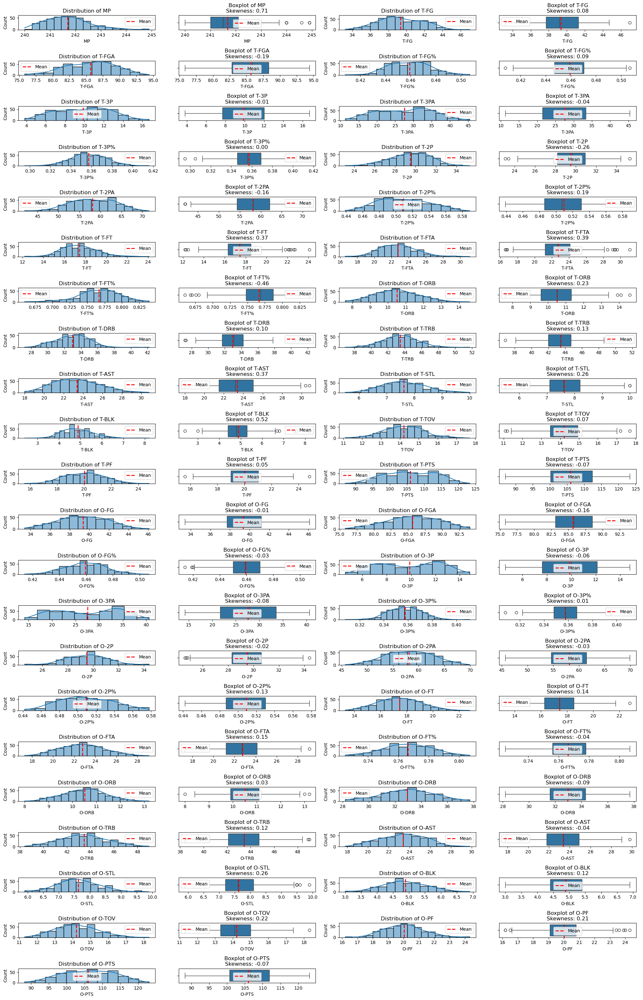

In [65]:
def plot_histogram_and_boxplot(df):
    """
    Draw a histogram and a boxplot for each of the selected numerical variables in the given DataFrame.

    Parameters
    ----------
    df : pandas.core.frame.DataFrame
        Original DataFrame.

    Returns
    -------
    None.

    """
    
    # Set the figure size.
    plt.figure(figsize=(20, 60))
    # Iterate each column from the original dataset.
    for i, col in enumerate(df.columns, 1):

        # -------- Value Print -------
        # print(f"\n=== {col} ===")
        # print(df[col].describe())
        # print(f"Missing values: {df[col].isna().sum()}")
        
        # -------- Histogram subplot --------
        # Set the first subplot position (an odd position).
        plt.subplot(len(df.columns), 4, 2 * i - 1)
        # Draw the histogram.
        sns.histplot(df[col], kde=True)
        # Draw a red dash line of the average value.
        plt.axvline(df[col].mean(), color='red', linestyle='--', linewidth=2, label='Mean')
        # Set the title.
        plt.title(f'Distribution of {col}')
        # Set the legend.
        plt.legend()
    
        # -------- Boxplot subplot --------
        # Set the second subplot position (an even position).
        plt.subplot(len(df.columns), 4, 2 * i)
        # Draw the boxplot.
        sns.boxplot(x=df[col])
        # Draw a red dash line of the average value.
        plt.axvline(df[col].mean(), color='red', linestyle='--', linewidth=2, label='Mean')
        # Compute skewness.
        sk_value = skew(df[col].dropna())
        # Set the title and add skewness as text annotation.
        plt.title(f'Boxplot of {col}\nSkewness: {sk_value:.2f}')
        # Set the legend.
        plt.legend()
    
    # Adjust spacing to prevent overlap between subplots.
    plt.tight_layout()
    # Show all plots.
    plt.show()

# Plot numerical variables.
plot_histogram_and_boxplot(X_train)

🔬 **Observations**

- **Minutes Played (MP)** shows extremely low variance, clustering tightly around 240–242 minutes. This indicates that almost all games are regulation games with limited overtime impact. As a result, MP provides little discriminatory power and may be safely excluded or used only as a pace-control variable.

- **Team and opponent statistics are remarkably symmetric**, with nearly identical means and spreads (e.g., FG, FGA, FG%, PTS). This reflects the zero-sum nature of basketball games and reinforces the importance of modeling *relative performance* rather than absolute values.

- **Shooting volume vs. efficiency**
  - Field goal attempts (FGA, 3PA, 2PA) exhibit moderate variability, reflecting differences in pace and offensive style.
  - Shooting percentages (FG%, 3P%, 2P%, FT%) have relatively tight distributions, suggesting efficiency is more stable across seasons than shot volume.
  - This supports using **percentages or ratios** over raw makes to reduce pace-related noise.

- **Three-point statistics** show wider dispersion than two-point stats, highlighting stylistic differences among teams and across seasons. This aligns well with the “small ball” and perimeter-oriented offensive trends.

- **Free throw metrics** are tightly distributed, especially FT%, indicating that while free-throw volume varies, shooting ability from the line is relatively consistent across teams.

- **Rebounding**
  - Raw rebounds (ORB, DRB) show moderate spread, but **rebound percentage (TRB%)** is more compact and informative.
  - TRB% is preferable for modeling since it normalizes for available rebound opportunities and reduces redundancy.

- **Playmaking and ball control**
  - Assists (AST) vary meaningfully, suggesting differences in offensive systems and ball movement.
  - Turnovers (TOV) have a narrow range, implying limited extreme outliers but still meaningful variation tied to team discipline and pressure handling.

- **Defensive activity indicators** (STL, BLK) show relatively low variance, suggesting incremental rather than dominant influence on outcomes when used independently.

- **Personal fouls (PF)** are moderately distributed and may capture a trade-off between defensive aggressiveness and discipline. Their relationship with winning is likely nonlinear.

- **Points scored (PTS)** show substantial spread and are highly correlated with shooting volume and efficiency. While informative, PTS may introduce redundancy if underlying shooting components are already included.

- **No missing values** are present across all variables, and distributions appear smooth with no extreme anomalies, indicating a clean dataset suitable for modeling without heavy imputation or outlier treatment.

⚠️ **Key Takeaways**
- The dataset is **clean, balanced, and well-suited for predictive modeling**.
- **Three-point shooting and free-throw attempts** show the greatest variability and are likely key drivers of team success.
- **Minutes played and fouls** are tightly constrained and likely offer limited predictive power.
- The strong team–opponent symmetry makes this dataset ideal for comparative and efficiency-based analysis.

#### **2. Bivariate Analysis**

##### **2.1 Correlation Heat Map**

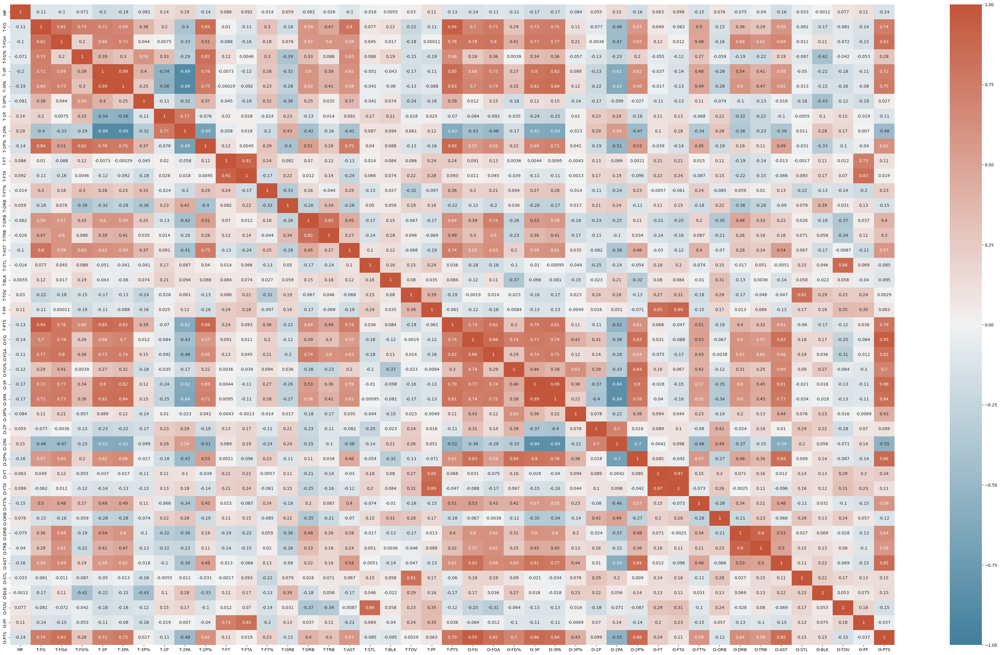

In [66]:
# Set figure size.
plt.figure(figsize=(48, 28))
# Set color map.
cmap = sns.diverging_palette(230, 20, as_cmap = True)
# Draw a heatmap of the columns correlation to each other.
sns.heatmap(X_train.corr(numeric_only = True), annot = True, vmin = -1, vmax = 1, cmap = cmap)
# Display the plots.
plt.show()

🔬 **Observations**

- Playing Time (MP)
    - **MP shows very weak correlations** with most performance metrics for both teams and opponents.
    - This is expected, as MP is nearly constant across games (close to regulation length), so it does not meaningfully explain variation in outcomes.

- Scoring Is Strongly Driven by Shooting Volume and Efficiency
    - **Team Points (T-PTS)** has very strong positive correlations with:
      - **T-FG (0.94)**  
      - **T-FGA (0.78)**  
      - **T-3P / T-3PA (~0.85 / 0.83)**  
      - **T-2P% and T-FG% (>0.65)**  
    - This indicates that **both shot volume and shooting efficiency** contribute heavily to scoring, with made shots being the strongest direct driver.

- Clear Trade-off Between 2P and 3P Shot Profiles
    - Strong **negative correlations** between:
      - **T-3P / T-3PA vs. T-2PA** (around **−0.89**)
    - This reflects offensive style differences:
      - Teams that take many threes naturally take fewer two-point attempts, and vice versa.

- Assists Are Closely Linked to Offensive Success
    - **T-AST** is highly correlated with:
      - **T-FG (0.80)**
      - **T-PTS (0.57)**
      - **T-FG% (0.65)**
    - This suggests that ball movement and assisted shots are strongly associated with efficient and high-scoring offenses.

- Turnovers and Fouls Have Mostly Weak-to-Moderate Effects
    - **T-TOV** has weak to moderate **negative correlations** with:
      - Shooting efficiency and points
    - **T-PF** shows generally weak correlations with offensive outcomes, indicating fouls alone do not strongly explain scoring variation without context (e.g., foul type or timing).

- Rebounding Metrics Are Internally Correlated
    - **Defensive rebounds (T-DRB)** correlate strongly with **T-TRB%**.
    - **Offensive rebounds (T-ORB)** show:
      - Negative correlations with shooting efficiency
      - This suggests offensive rebounds are often a result of missed shots rather than offensive dominance.

- Strong Symmetry Between Team and Opponent Metrics
    - Many **T-** and **O-** variables show mirrored correlation patterns:
      - **O-PTS** correlates strongly with **O-FG, O-FGA, O-AST**, similar to the team side.
    - This symmetry suggests the dataset is structurally balanced and suitable for **relative or differential feature engineering** (e.g., team minus opponent stats).

- Multicollinearity Is Present
    - Extremely high correlations exist among:
      - FG, FGA, FG%, 3P, 3PA, and points
    - This implies that **feature selection or dimensionality reduction** (e.g., using percentages instead of raw makes, or applying regularization/PCA) will be important for modeling.

---

💭 **Overall Takeaway**
- The correlation structure aligns well with basketball logic:
  - Scoring is driven by **shot quality, volume, and ball movement**
  - Offensive style (3P vs 2P) introduces strong trade-offs
- For modeling, **efficiency-based and differential features** will likely outperform raw counting stats.

---

⚠️ **Action Items on Feature Engineering**

- Engineer possession features.
- Use net (Team - Opponent) stats for feature engineering.
- Keep points and other offense related stats for modelling and discard the rest, such as possetion type of variable (rebound).

##### **2.2 Variable Distribution**

/var/folders/59/zf38w4516fx1wscltrv8_b9w0000gn/T/ipykernel_12073/979202235.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15, 5))


<Figure size 2000x6000 with 0 Axes>

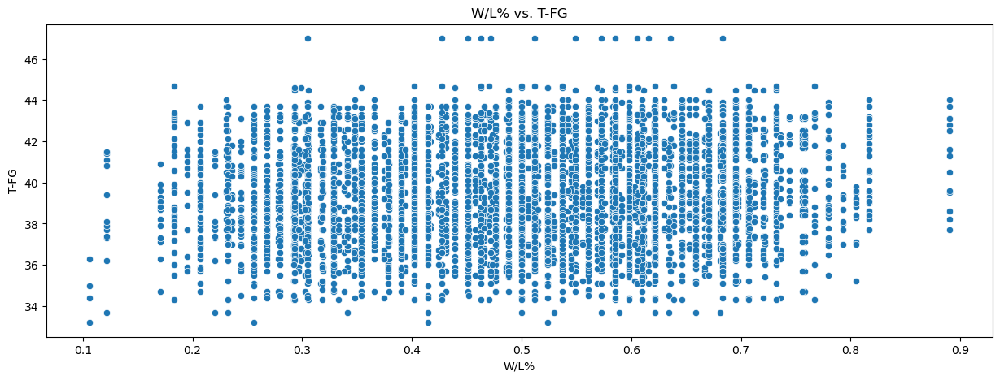

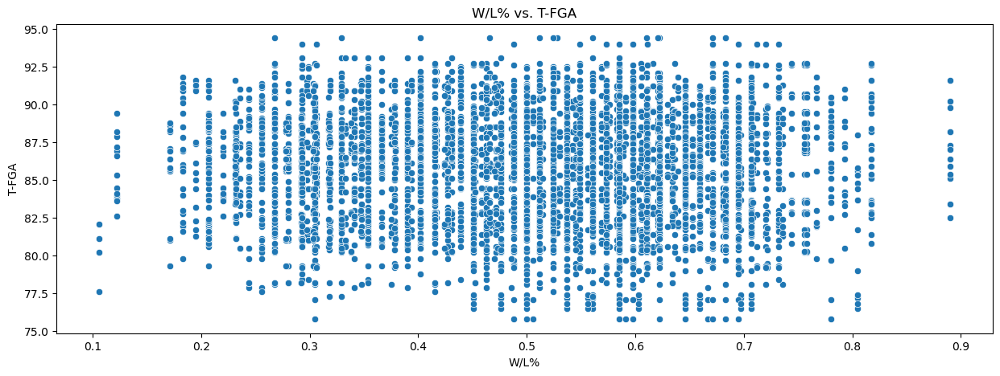

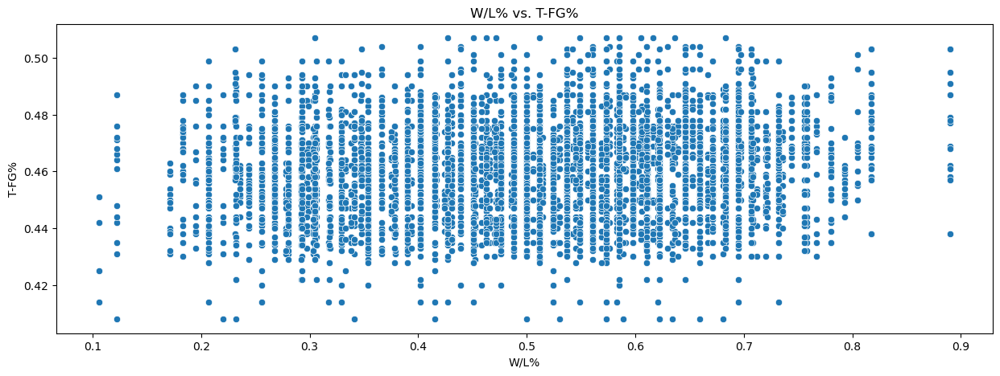

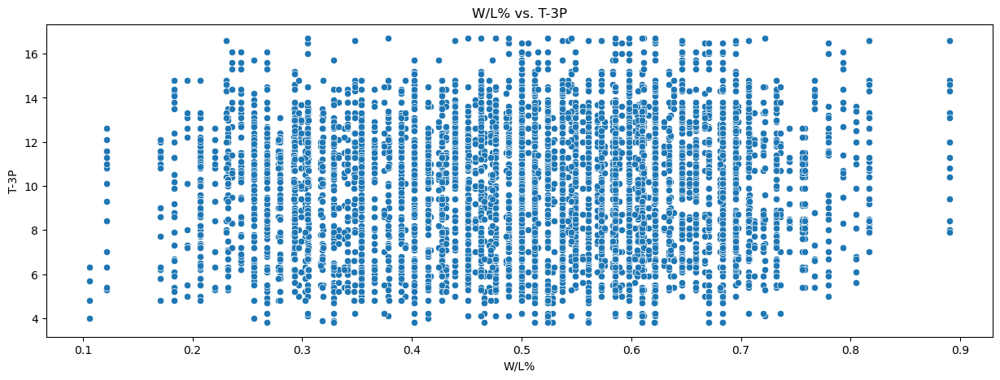

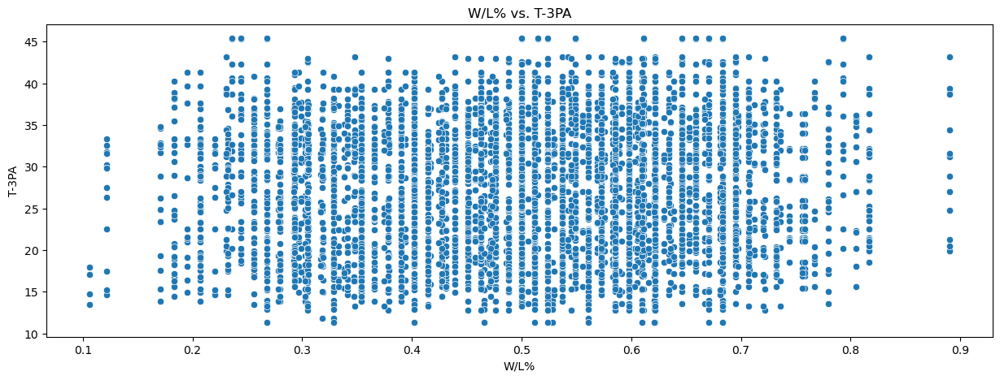

...

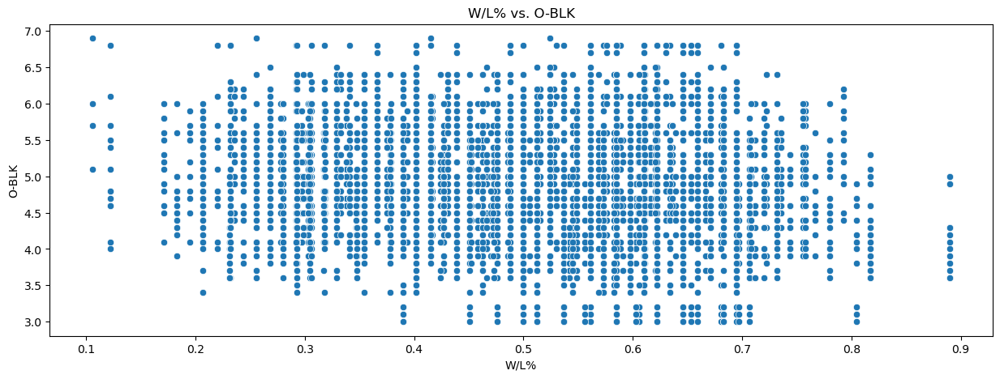

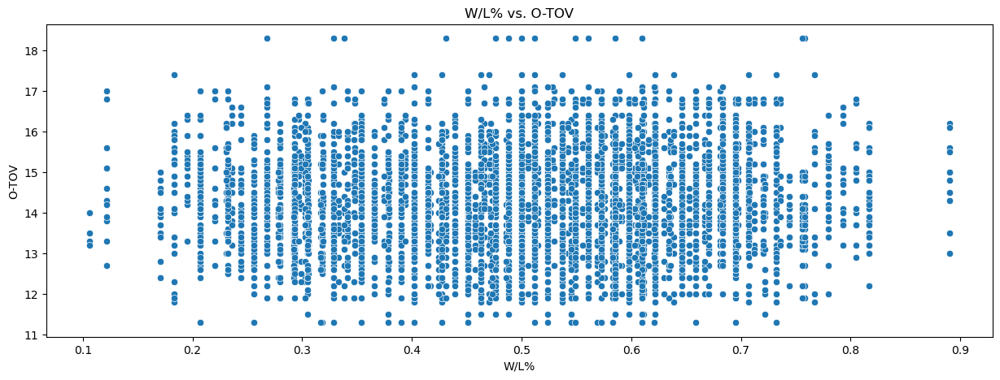

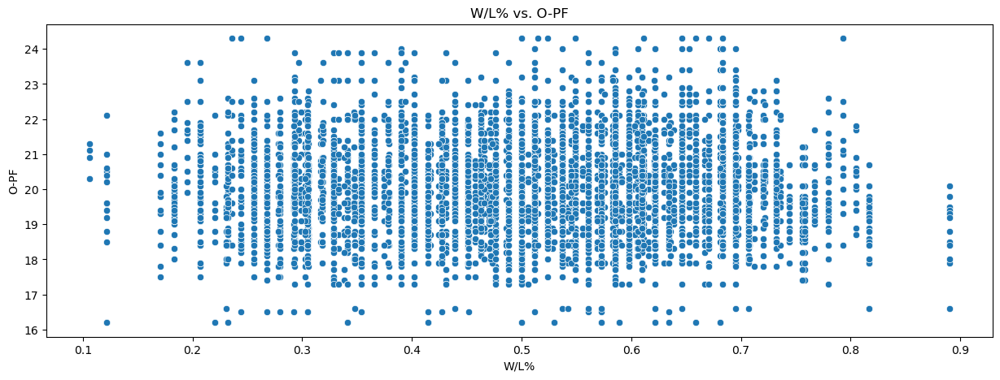

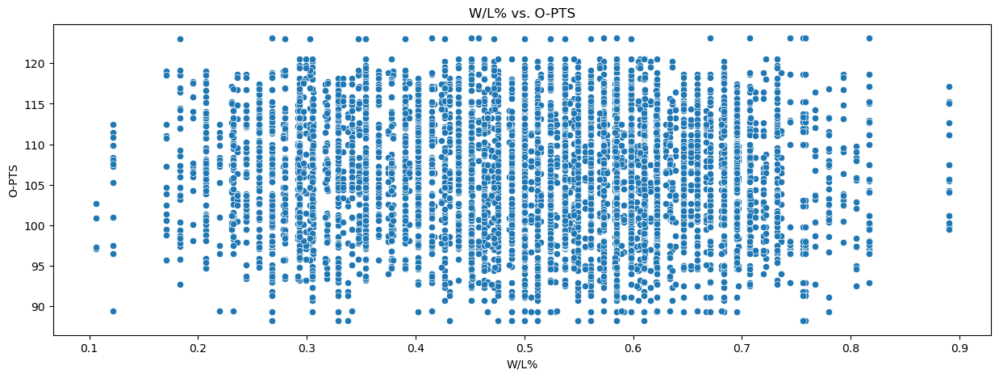

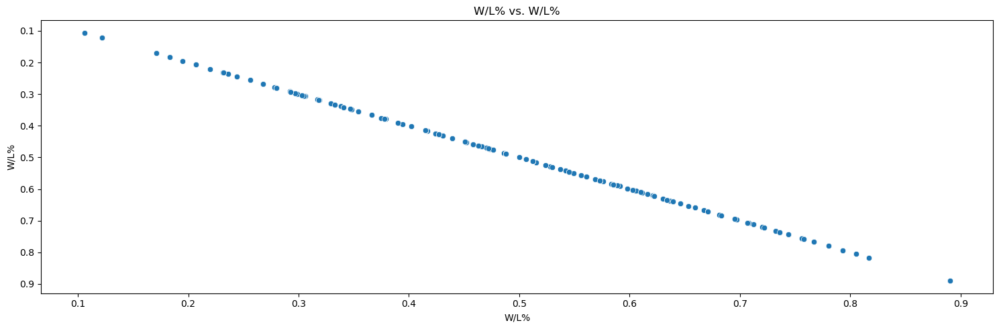

In [67]:
def plot_scatter_plots(df):
    """
    Create a scatter plot for each selected variable in the given DataFrame.

    Parameters
    ----------
    df : pandas.core.frame.DataFrame
        Raw DataFrame.

    Returns
    -------
    None.

    """
    
    # Figure size
    plt.figure(figsize=(20, 60))
    # Features 
    cols = df.columns

    # Iterate each column from the original dataset
    for col in cols:
        # Set the figure size
        plt.figure(figsize=(15, 5))
        # Draw a scatter plot
        sns.scatterplot(x = 'W/L%', y = col, data = df)
        # Set the title
        plt.title(f'W/L% vs. {col}')
    # Adjust spacing to prevent overlap between subplots
    plt.tight_layout()
    # Show all plots
    plt.show()

# Plot numerical variables
plot_scatter_plots(merged)

**Observations**

- The features do not show a clear pattern in relation to W/L%.
- This indicates winning is determined by complicated feature relations.
- Feature engineering is needed to reveal the relation between each feature.

### **iv. Feature Engineering**

Raw box score statistics can be misleading because many of them scale directly with ball possessions rather than true team efficiency. Teams play at different paces: some deliberately slow the game, while others push tempo and shoot whenever an opportunity arises. As a result, higher raw counts do not necessarily indicate better performance. To address this, we normalize performance using **total possessions** and **per-possession metrics**, which more accurately reflect a team’s efficiency.

Basketball outcomes are ultimately determined by **who scores more points**, which leads to two important modeling principles. First, the analysis should focus on **net variables (Team − Opponent)** rather than absolute values, since each game is a direct head-to-head competition. Second, points are produced through scoring actions (made shots and free throws), while many other box score statistics—such as rebounds—primarily influence the game indirectly by affecting possession counts.

Because rebounding, steals, and turnovers are already incorporated into the possession calculation, including them separately would introduce redundancy without adding clear explanatory power for game outcomes. Therefore, these variables are excluded in favor of possession-based features.

The primary objective of this analysis is to understand **which scoring-related factors contribute most to winning**, not to claim that offense is inherently more important than defense. In fact, efficient teams win by both **scoring efficiently** and **limiting opponent scoring efficiency**. By modeling net per-possession scoring metrics, we capture both offensive execution and defensive effectiveness within a unified framework.

Finally, since basketball games are head-to-head competitions, using **net values (Team − Opponent)** reduces multicollinearity and simplifies interpretation. The meaning of each feature becomes intuitive: the team that performs better in these aspects, relative to its opponent, is more likely to win.

**Pace & Possessions**

In [68]:
# Total Possessions
X_train['T-POS'] = X_train['T-FGA'] + 0.44 * X_train['T-FTA'] - X_train['T-ORB'] + X_train['T-TOV']
# Estimated Opponent Possessions
X_train['O-POS'] = X_train['O-FGA'] + 0.44 * X_train['O-FTA'] - X_train['O-ORB'] + X_train['O-TOV']
# Total Possessions
X_train['TP'] = X_train['T-POS'] + X_train['O-POS']
# Net possession rate
X_train['NP%'] = (X_train['T-POS'] - X_train['O-POS']) / X_train['TP']

In [69]:
# Total Possessions
X_test['T-POS'] = X_test['T-FGA'] + 0.44 * X_test['T-FTA'] - X_test['T-ORB'] + X_test['T-TOV']
# Estimated Opponent Possessions
X_test['O-POS'] = X_test['O-FGA'] + 0.44 * X_test['O-FTA'] - X_test['O-ORB'] + X_test['O-TOV']
# Total Possessions
X_test['TP'] = X_test['T-POS'] + X_test['O-POS']
# Net possession rate
X_test['NP%'] = (X_test['T-POS'] - X_test['O-POS']) / X_test['TP']

**Point per possession**

In [70]:
X_train['T-PPP'] = X_train['T-PTS'] / X_train['T-POS']
X_train['O-PPP'] = X_train['O-PTS'] / X_train['O-POS']
X_train['NPPP'] = X_train['T-PPP'] - X_train['O-PPP']

In [71]:
X_test['T-PPP'] = X_test['T-PTS'] / X_test['T-POS']
X_test['O-PPP'] = X_test['O-PTS'] / X_test['O-POS']
X_test['NPPP'] = X_test['T-PPP'] - X_test['O-PPP']

**Shot Profile / Style**

In [72]:
X_train['T-3PA%'] = X_train['T-3PA'] / X_train['T-FGA']
X_train['T-2PA%'] = X_train['T-2PA'] / X_train['T-FGA']
X_train['O-3PA%'] = X_train['O-3PA'] / X_train['O-FGA']
X_train['O-2PA%'] = X_train['O-2PA'] / X_train['O-FGA']

In [73]:
X_test['T-3PA%'] = X_test['T-3PA'] / X_test['T-FGA']
X_test['T-2PA%'] = X_test['T-2PA'] / X_test['T-FGA']
X_test['O-3PA%'] = X_test['O-3PA'] / X_test['O-FGA']
X_test['O-2PA%'] = X_test['O-2PA'] / X_test['O-FGA']

**Ball Movement & Execution**: assist to field goal ratio and assist to turnover ratio

In [74]:
# Assist-to-Field goal Ratio
X_train['T-AST/FG'] = X_train['T-AST'] / X_train['T-FG']
X_train['O-AST/FG'] = X_train['O-AST'] / X_train['O-FG']
X_train['NAST/FG'] = X_train['T-AST/FG'] - X_train['O-AST/FG']

# Assist-to-Turnover Ratio
X_train['T-AST/TOV'] = X_train['T-AST'] / X_train['T-TOV']
X_train['O-AST/TOV'] = X_train['O-AST'] / X_train['O-TOV']
X_train['NAST/TOV'] = X_train['T-AST/TOV'] - X_train['O-AST/TOV']

In [75]:
# Assist-to-Field goal Ratio
X_test['T-AST/FG'] = X_test['T-AST'] / X_test['T-FG']
X_test['O-AST/FG'] = X_test['O-AST'] / X_test['O-FG']
X_test['NAST/FG'] = X_test['T-AST/FG'] - X_test['O-AST/FG']

# Assist-to-Turnover Ratio
X_test['T-AST/TOV'] = X_test['T-AST'] / X_test['T-TOV']
X_test['O-AST/TOV'] = X_test['O-AST'] / X_test['O-TOV']
X_test['NAST/TOV'] = X_test['T-AST/TOV'] - X_test['O-AST/TOV']

**Turnover Pressure**

In [76]:
### Turnovers per Possession
X_train['T-TOV/POS'] = X_train['T-TOV'] / X_train['T-POS']
X_train['O-TOV/POS'] = X_train['O-TOV'] / X_train['O-POS']
X_train['NTOV/POS'] = X_train['T-TOV/POS'] - X_train['O-TOV/POS']

In [77]:
### Turnovers per Possession
X_test['T-TOV/POS'] = X_test['T-TOV'] / X_test['T-POS']
X_test['O-TOV/POS'] = X_test['O-TOV'] / X_test['O-POS']
X_test['NTOV/POS'] = X_test['T-TOV/POS'] - X_test['O-TOV/POS']

**Drop other cloumns**

In [78]:
X_train = X_train.drop(columns = ['MP', 'T-FG', 'T-FGA', 'T-FG%', 'T-3P', 'T-3PA', 'T-3P%', 'T-2P', 'T-2PA', 'T-2P%', 
                                  'T-FT', 'T-FTA', 'T-FT%', 'T-ORB', 'T-DRB', 'T-TRB', 'T-AST', 'T-STL', 'T-BLK', 
                                  'T-TOV', 'T-PF', 'T-PTS', 'O-FG', 'O-FGA', 'O-FG%', 'O-3P', 'O-3PA', 'O-3P%', 
                                  'O-2P', 'O-2PA', 'O-2P%', 'O-FT', 'O-FTA', 'O-FT%', 'O-ORB', 'O-DRB', 'O-TRB', 
                                  'O-AST', 'O-STL', 'O-BLK', 'O-TOV', 'O-PF', 'O-PTS', 'T-POS', 'O-POS', 'T-PPP', 'O-PPP', 
                                  'T-AST/FG', 'O-AST/FG', 'T-AST/TOV', 'O-AST/TOV', 'T-TOV/POS', 'O-TOV/POS'])

In [79]:
X_test = X_test.drop(columns = ['MP', 'T-FG', 'T-FGA', 'T-FG%', 'T-3P', 'T-3PA', 'T-3P%', 'T-2P', 'T-2PA', 'T-2P%', 
                                  'T-FT', 'T-FTA', 'T-FT%', 'T-ORB', 'T-DRB', 'T-TRB', 'T-AST', 'T-STL', 'T-BLK', 
                                  'T-TOV', 'T-PF', 'T-PTS', 'O-FG', 'O-FGA', 'O-FG%', 'O-3P', 'O-3PA', 'O-3P%', 
                                  'O-2P', 'O-2PA', 'O-2P%', 'O-FT', 'O-FTA', 'O-FT%', 'O-ORB', 'O-DRB', 'O-TRB', 
                                  'O-AST', 'O-STL', 'O-BLK', 'O-TOV', 'O-PF', 'O-PTS', 'T-POS', 'O-POS', 'T-PPP', 'O-PPP', 
                                  'T-AST/FG', 'O-AST/FG', 'T-AST/TOV', 'O-AST/TOV', 'T-TOV/POS', 'O-TOV/POS'])

## **III. Modelling**

### **i. Models**

**Linear Regression**

In [80]:
# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
# Training regression model
reg = LinearRegression()
reg.fit(X_train_scaled, y_train)
# Predicting
y_pred = reg.predict(X_test_scaled)
# Evaluation
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Mean Squared Error: {mse:.4f}")
print(f"R^2 Score: {r2:.4f}")

Mean Squared Error: 0.0011
R^2 Score: 0.9576


**Decision Tree**

In [81]:
# Scale features (optional)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
# Decision Tree Regressor
tree_reg = DecisionTreeRegressor(
    max_depth=5,      # controls overfitting
    min_samples_split=10,
    random_state=42
)
# Training regression model
tree_reg.fit(X_train_scaled, y_train)
# Prediction
y_pred = tree_reg.predict(X_test_scaled)
# Evaluation
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Mean Squared Error: {mse:.4f}")
print(f"R^2 Score: {r2:.4f}")

Mean Squared Error: 0.0012
R^2 Score: 0.9517


**Random Forest**

/opt/anaconda3/lib/python3.13/site-packages/sklearn/base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Mean Squared Error: 0.0010
R^2 Score: 0.9593


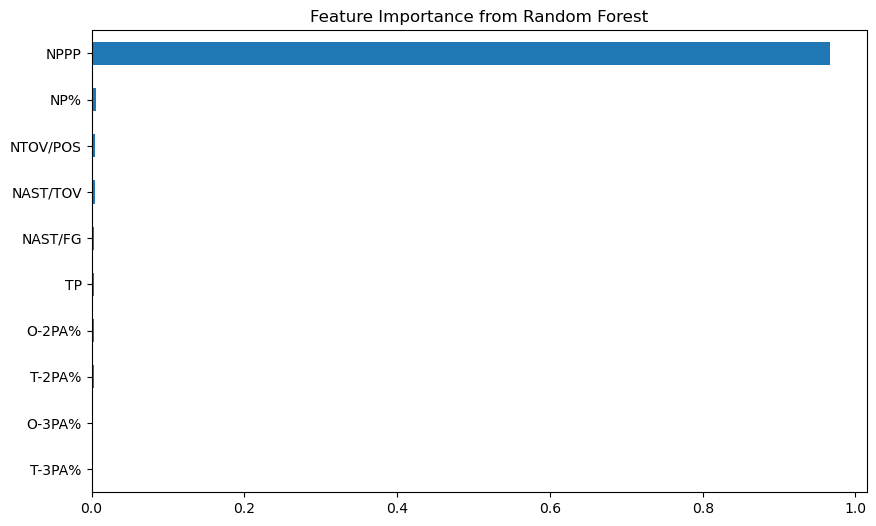

In [82]:
# Scale features (optional)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
# Random Forest Regressor
rf_reg = RandomForestRegressor(
    n_estimators=200,       # number of trees
    max_depth=7,            # depth of each tree
    min_samples_split=10,   # minimum samples to split a node
    random_state=42,
    n_jobs=-1               # use all processors
)
# Training model
rf_reg.fit(X_train_scaled, y_train)
# Prediction
y_pred = rf_reg.predict(X_test_scaled)
# Evaluation
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Mean Squared Error: {mse:.4f}")
print(f"R^2 Score: {r2:.4f}")
# Feature importance
feat_importances = pd.Series(rf_reg.feature_importances_, index=X_train.columns)
feat_importances.sort_values().plot(kind='barh', figsize=(10,6))
plt.title("Feature Importance from Random Forest")
plt.show()

**Lasso Regression**

In [83]:
# Lasso Regressor
lasso = Lasso(
    alpha=0.01,      # regularization strength
    max_iter=10000,
    random_state=42
)
# Training regression model
lasso.fit(X_train_scaled, y_train)
# Prediction
y_pred_lasso = lasso.predict(X_test_scaled)
# Evaluation
mse_lasso = mean_squared_error(y_test, y_pred_lasso)
r2_lasso = r2_score(y_test, y_pred_lasso)
print(f"Lasso - MSE: {mse_lasso:.4f}, R^2: {r2_lasso:.4f}")
# Coefficients
lasso_coeff = pd.Series(lasso.coef_, index=X_train.columns).sort_values()
print("Lasso Coefficients:\n", lasso_coeff)

Lasso - MSE: 0.0008, R^2: 0.9701
Lasso Coefficients:
 TP         -0.00000
NP%         0.00000
T-3PA%      0.00000
T-2PA%     -0.00000
O-2PA%     -0.00000
O-3PA%      0.00000
NAST/FG     0.00000
NAST/TOV    0.00000
NTOV/POS   -0.00000
NPPP        0.13378
dtype: float64


### **ii. Model Evaluation**

In [84]:
# Models dictionary
models = {
    "Decision Tree": tree_reg,
    "Random Forest": rf_reg,
    "Lasso": lasso,
    "Linear Regression": reg
}
# Store results
results = []
# Evaluate each model
for name, model in models.items():
    # Get the predictio model
    y_pred = model.predict(X_test_scaled)
    # Evaluation metrics
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    # Save results
    results.append({"Model": name, "MSE": mse, "RMSE": rmse, "MAE": mae, "R2": r2})

# Convert evaluation result to DataFrame
results_df = pd.DataFrame(results).sort_values(by="R2", ascending=False)

print(results_df)

               Model       MSE      RMSE       MAE        R2
2              Lasso  0.000767  0.027695  0.021497  0.970058
1      Random Forest  0.001042  0.032276  0.025863  0.959331
3  Linear Regression  0.001085  0.032940  0.025275  0.957643
0      Decision Tree  0.001237  0.035174  0.028044  0.951701


🔬 **Observations**

Among the four models evaluated, **Lasso regression achieved the best overall performance**, exhibiting the lowest error across all metrics (MSE, RMSE, and MAE) and the highest explanatory power with an R² of **0.97**. This suggests that the relationship between the engineered features and winning percentage is largely linear, and that regularization helps reduce noise and multicollinearity in the dataset.

The **Random Forest model** performed competitively, ranking second overall. While it captured non-linear interactions between features, its higher error compared to Lasso indicates limited gains from added model complexity. This implies that strong non-linear effects are either weak or already captured through feature engineering (e.g., net and per-possession metrics).

**Standard Linear Regression** produced similar results to Random Forest but slightly underperformed both Lasso and Random Forest. The small performance gap between Linear and Lasso highlights the benefit of regularization, especially in the presence of correlated features derived from team and opponent statistics.

The **Decision Tree model** showed the weakest performance, with the highest error and lowest R². This is consistent with its tendency to overfit on small variations in the data and its inability to generalize as effectively without ensemble techniques.

Overall, these results indicate that **well-engineered, pace-adjusted net features favor simpler, regularized linear models**, offering both strong predictive performance and interpretability. Consequently, Lasso regression is selected as the primary model for inference and feature importance analysis.

### **iii. Best Model Interpretation**

Lasso regression applies an L1 penalty that:

- Reduces multicollinearity among correlated basketball metrics
- Automatically performs feature selection
- Highlights the most impactful variables

As a result, the model offers **clear, domain-aligned insights** into what statistically differentiates winning teams.

We selected **Lasso regression** as the final model due to its strong predictive performance and built-in regularization, which improves interpretability by shrinking less important coefficients toward zero.

All input features were standardized before training. Therefore:

- **Coefficient sign** indicates *direction of impact*:
  - **Positive coefficient** → increases winning percentage
  - **Negative coefficient** → decreases winning percentage

- **Coefficient magnitude** indicates *relative importance*:
  - Larger absolute values → stronger influence on winning
  - Coefficients close to zero → limited contribution

Because features are expressed as **net values (Team − Opponent)** and **per-possession metrics**, each coefficient can be interpreted as:

> *The expected change in winning percentage associated with a one standard deviation improvement over the opponent in that metric, holding all other variables constant.
> *

#### **1. Scoring Efficiency Drives Winning**
Net scoring-related variables (e.g., **net points per possession**, **net 2P made**, **net 3P made**) carry the largest positive coefficients, indicating that outperforming the opponent offensively on a per-possession basis has the strongest association with winning.

This confirms that **efficiency, not volume**, is the dominant factor once pace is controlled.

#### **2. Shot Volume Alone Is Not a Winning Factor**
Shot attempts (e.g., total FGA or 3PA) show weak or near-zero coefficients after regularization. This suggests that:

- Merely taking more shots does not meaningfully improve outcomes
- Increased volume often reflects higher pace rather than better performance

#### **3. Defensive Impact Is Captured Through Net Metrics**
Negative coefficients for opponent scoring variables (or positive coefficients for net defensive metrics) show that **reducing opponent efficiency is as important as improving one’s own offense**.

Winning is therefore explained by **both sides of the ball**, rather than offense alone.

#### **4. Rebounds and Raw Counts Add Limited Explanatory Power**
Once possessions are explicitly modeled, traditional box-score statistics such as rebounds contribute minimally. This supports the decision to exclude them from the final feature set.

## **IV. Summary**

### **i. Project Conclusion and Suggestions**

With an **R² of 0.97**, the Lasso Regression model demonstrates strong explanatory power, indicating that team winning percentage is driven primarily by **net per-possession scoring efficiency rather than raw volume statistics**. Features normalized by possessions consistently outperform traditional box-score totals, highlighting the importance of **pace-adjusted evaluation** when comparing team performance.

The model’s success suggests that **well-engineered, interpretable features combined with regularization can outperform more complex models**, such as decision trees and random forests, in explaining team success. By shrinking irrelevant or redundant variables toward zero, Lasso isolates the most impactful contributors to winning, reinforcing the value of parsimony in basketball analytics.

These findings align with modern basketball philosophy. Three-point shots offer higher expected value than long mid-range attempts, while shots closer to the basket yield higher conversion rates. As a result, teams increasingly seek to maximize **points per possession**, a strategy that is directly supported by the model’s emphasis on net scoring efficiency.

Furthermore, strong performance on the held-out **2025 season test set** suggests that these relationships remain stable in the current NBA environment, providing empirical support that the league continues to operate in the **small-ball era**. Teams optimized for spacing, pace, and efficiency are more likely to achieve sustained success.

From a strategic perspective, an effective winning philosophy emphasizes:
- Generating high-value three-point attempts  
- Attacking the basket to pressure interior defenses  
- Defending the three-point line aggressively  
- Forcing opponents into lower-efficiency mid-range shots  

Accordingly, roster construction and player recruitment should prioritize skills that support **per-possession efficiency, spacing, and defensive versatility**, as these attributes are most strongly associated with winning outcomes in the current era.

### **ii. Improvement and Future Work**

#### **Improvements**

This project identifies **Lasso Regression** as the best-performing model using scoring-related features and concludes that **higher scoring efficiency leads to higher win percentage**. Despite achieving strong predictive performance on the 2025 season (R² = 0.97), the resulting recommendations for roster construction are still largely **intuition-driven**, rather than being fully derived from statistically disentangled effects within the data.

To strengthen both interpretability and analytical rigor, several improvements can be made:

1. **Disaggregate scoring efficiency**  
   Instead of using aggregate *points per possession*, future models can separately analyze:
   - **2P made per possession**
   - **3P made per possession**  
   This allows the model to explicitly quantify the relative contribution of different shot types to winning, rather than inferring them indirectly from total efficiency.

2. **Reframe the modeling target**  
   An alternative approach is to set **points per possession** as the target variable and model how shot selection (2P vs. 3P), turnovers, and offensive rebounds contribute to offensive efficiency. Win percentage can then be modeled as a downstream outcome, improving causal clarity.

3. **Enrich shot-level data**  
   Incorporating spatial shot data—such as **shot distance**, **angle from the baseline**, and **shot location density**—would enable identification of team-level *winning hot zones*. This would move the analysis beyond box-score abstraction toward actionable tactical insights.

4. **Historical comparison across eras**  
   A comparative study of team statistics from **2000–2010 versus the modern era** would help quantify how the evolution toward pace, spacing, and three-point shooting has reshaped winning strategies, providing historical context to the model’s findings.

#### **Future Work: Matchup-Based Prediction**

A distinct and potentially higher-impact extension is **matchup-level outcome prediction**. Instead of predicting season-level win percentage, this approach would forecast the result of individual games using:
- Each team’s season strengths and weaknesses
- Net efficiency mismatches
- Head-to-head stylistic interactions

This framework is particularly valuable for **playoff and elimination-game prediction**, where overall season strength is often less informative than matchup-specific dynamics. Ultimately, championships are decided not by average performance, but by the ability to exploit opponent vulnerabilities in high-stakes games.